# Parte 1: Maximização de Função
---

## Parâmetros editáveis

In [121]:
# ADD STUFF HERE

Antes de executar este caderno, pode ser necessário instalar previamente as dependências em seu sistema. Isso pode ser feito com os seguintes comandos:
```bash
pip install --user numpy
```

## Dependências


In [122]:
import numpy as np
np.random.seed(58)

import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits import mplot3d

from copy import copy, deepcopy
from tqdm import tqdm

## Modelagem

In [123]:
# This class represents one solution in the search space (one point in R^2)
class State():
    def __init__(self, position):
        self.position = position
        self.dimensions = position.shape

    def successor(self, step):
        # Since this is a continuous problem, the neighbordhood is a certain region
        # delimited by +/- step in each axis
        disturbance = np.random.uniform(-1, 1, self.dimensions)
        next_position = self.position + step * disturbance
        return State(next_position)


## Algoritmo: Simulated Annealing


In [124]:
def max_func(loss, initial_state, scheduler, max_iter = 100_000):
    # Initial setup
    current = initial_state
    curr_val = loss(current.position)

    # Storing the trajectory (history of states during the search)
    # For visualization and debugging purposes only (not needed)
    # This consumes a lot of (unnecessary) space and shouldn't be used in production!
    positions = [current.position]
    values = [curr_val]

    for _ in tqdm(range(max_iter)):
        # Both the "temperature" and the step may be scheduled
        # Returns a flag signalling to break
        T, step, done = next(scheduler)
        if done:
            break

        # Saving the new state and value
        positions.append(current.position)
        values.append(curr_val)

        # Choosing and evaluating the successor
        successor = current.successor(step)
        succ_val = loss(successor.position)
        delta_val = succ_val - curr_val

        # Better state reached
        if delta_val > 0:
            current = successor
            curr_val = succ_val
            continue

        # Worse state: give it a try
        if np.random.rand() < np.exp(delta_val / T):
            current = successor
            curr_val = succ_val
            continue

    return current, curr_val, positions, values


## Execução

### Parâmetros da Busca

In [125]:
# 1st Param
# Initial position in the search space
initial_position = np.array([0, 0])


# 2st Param
# Temperature and step schedulers
def scheduler():
    # Parameters
    T = T_0 = 1
    T_min = 1E-4
    step = 0.001 # Fixed step

    # Scheduling
    n = 0
    while T >= T_min:
        n += 1
        T = T_0/n
        yield T, step, False
    yield T, step, True


# 3st Param
# Function to maximize
def function(vector):
    val = 0

    x = vector[0]
    y = vector[1]

    # 1st term
    factor = (x - 1)**2 + (y - 1)**2
    val += 4 * np.exp(-factor)

    # 2nd and 3rd terms (both are equal)
    factor = (x - 3)**2 + (y - 3)**2
    val += 2 * np.exp(-factor)

    # 4th term
    factor = (x + 3)**2 + (y - 3)**2
    val += np.exp(-factor)

    # 5th term
    factor = (x - 3)**2 + (y + 3)**2
    val += np.exp(-factor)

    # 6th term
    factor = (x + 3)**2 + (y + 3)**2
    val += np.exp(-factor)

    return val

### Rodando o Algoritmo 

In [126]:
initial_state = State(initial_position)
solution, value, positions, values = max_func(function, initial_state, scheduler())

 10%|█         | 10001/100000 [00:00&lt;00:02, 34714.22it/s]


### Solução Obtida

In [127]:
print('MÁXIMO GLOBAL: ', solution.position)
print('VALOR DO MÁXIMO GLOBAL: ', value)

MÁXIMO GLOBAL:  [0.99817641 1.00237218]
VALOR DO MÁXIMO GLOBAL:  4.00063658662755


## Gráficos

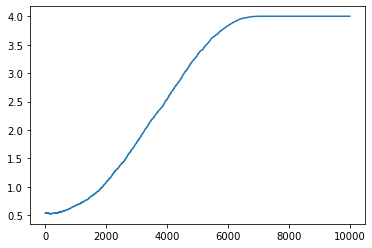

In [128]:
fig = plt.figure()
plt.plot(values)
fig.savefig('./images/values.png')

In [129]:
x = []
y = []
for pos in positions:
    x.append(pos[0])
    y.append(pos[1])
z = values

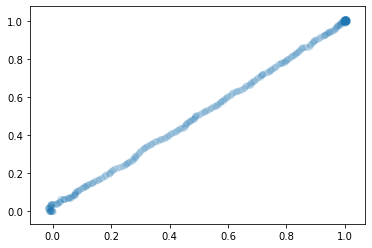

In [130]:
total = len(x)
step = total//500

fig = plt.figure()
x[::step]
plt.scatter(x[::step],y[::step], alpha=0.1)
fig.savefig('./images/positions.png')

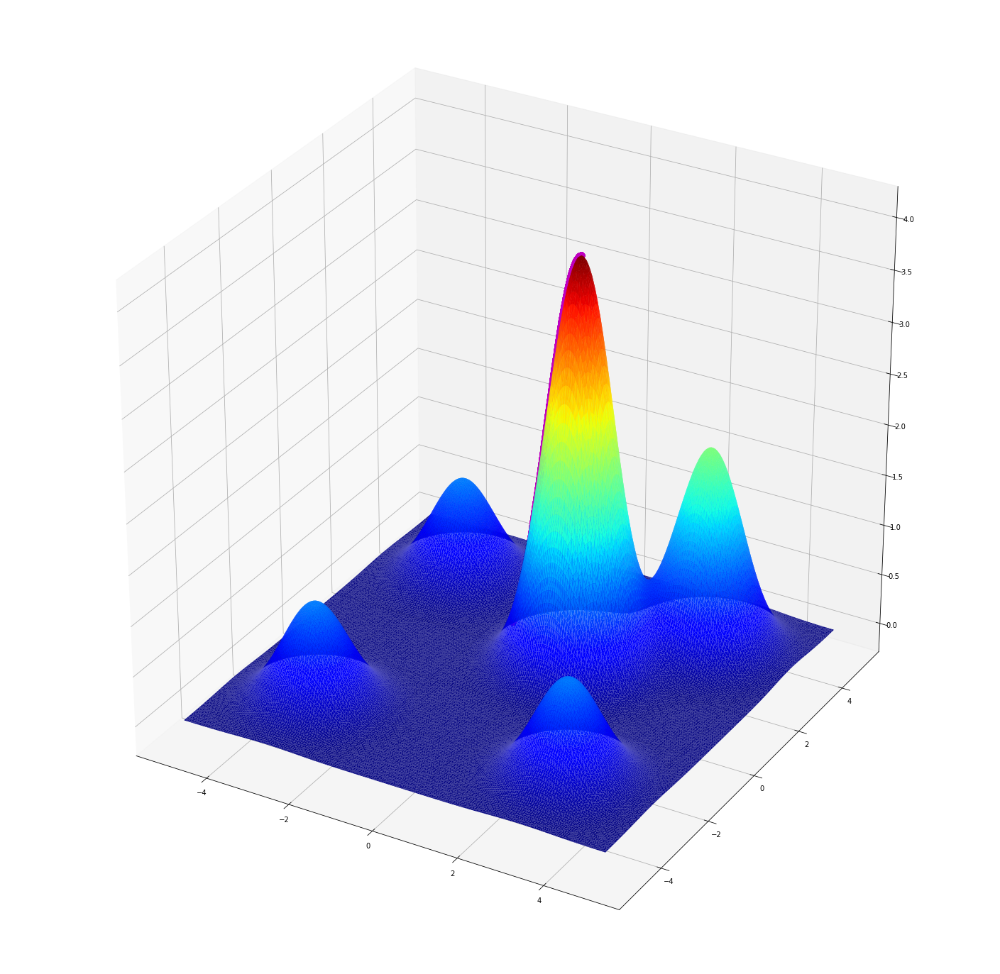

In [131]:
nx = 200
ny = 200

X = np.linspace(-5, 5, nx)
Y = np.linspace(-5, 5, ny)

X, Y = np.meshgrid(X, Y)
Z = np.zeros((nx, ny))
for i in range(nx):
    for j in range(ny):
        u = [X[i,j], Y[i,j]]
        Z[i,j] = function(u)

x = X.flatten()
y = Y.flatten()
z = Z.flatten()

fig = plt.figure(figsize=(25, 25))
ax = plt.axes(projection='3d')

ax.plot_trisurf(x, y, z, cmap=cm.jet, linewidth=0)

x = []
y = []
for pos in positions:
    x.append(pos[0])
    y.append(pos[1])
z = values
ax.scatter3D(x, y, z, s=70, c='m')

fig.savefig('./images/surface.png')
